# Project: Finding and labelling coins in an image

**Group ID:** 40

**Team name:** Lëtzebueeeerg

**Author 1:** Paul Lanfermann (327699)

**Author 2:** Thomas Lenges (325245) 

In [1]:
# Basics
import os
import time
import random
import numpy as np
import csv

# Plotting
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

# Image processing
import cv2
from skimage.morphology import remove_small_objects

# labelling the images
import tkinter as tk
from PIL import Image, ImageTk

# NN
import torch
from torch.utils.data import DataLoader, random_split, Dataset
from torch.optim import Adam
import torch.nn as nn
from PIL import Image
from torchvision.models import ResNet18_Weights, resnet18
from sklearn.metrics import f1_score

### Dataset recovery
We create a dictionnary containing the training lables such that dict["image"] = [n_5CHF,n_2CHF,...,n_OoD]

In [2]:
csv_file = os.path.join("..", "data", "project", "train_labels.csv")

# Initialize an empty dictionary
data_dict = {}

# Read the CSV file
with open(csv_file, 'r') as file:
    # Create a CSV reader object
    csv_reader = csv.reader(file)
    
    # Read the header row
    header = next(csv_reader)
    
    # Iterate over each row in the CSV file
    for row in csv_reader:
        # Extract data from the row
        file_name = row[0]
        number_of_coins = [int(value) for value in row[1:17]]
        
        # Add the array to the dictionary with the file name as the key
        data_dict[file_name] = number_of_coins

In [3]:
## Example:
image = "L1010277"
print("data_dict[\""+image+"\"] contains:", data_dict[image])
print("Total number of coins:", np.sum(data_dict["L1010277"]))

data_dict["L1010277"] contains: [1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 2, 0, 0, 0, 0, 0]
Total number of coins: 5


## Intuition
To get an idea about the relevance of the different color spaces, we plotted the BGR, HSV and LAB color spaces for several images in a subset of images that we grouped inside a "samples" folder. 

[]

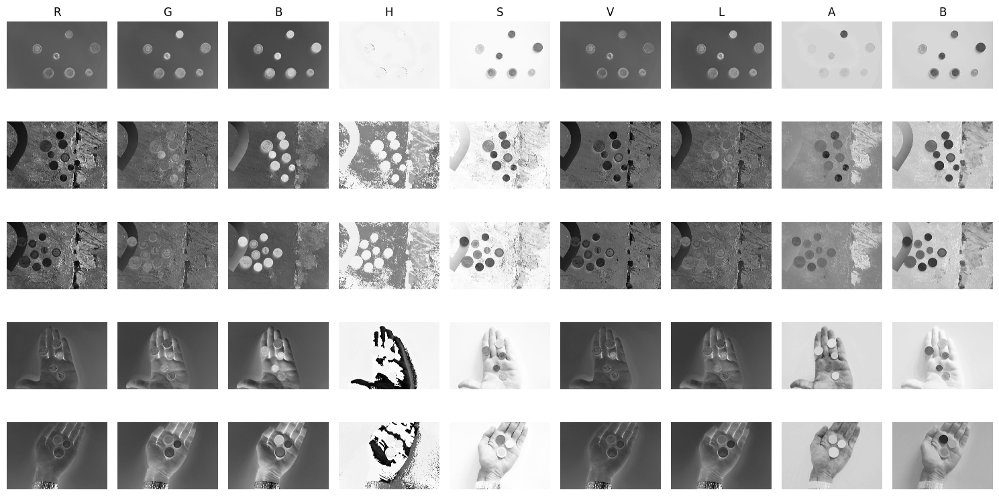

In [4]:
sample_path = os.path.join("..","data", "project", "samples")

sample_files = os.listdir(sample_path)

fig, ax = plt.subplots(len(sample_files), 9, figsize=(15, 8))

# Set title of column
titles = ["R", "G", "B", "H", "S", "V", "L", "A", "B"]
for i in range(9):
    ax[0][i].set_title(titles[i])

# Open each file
for i, file in enumerate(sample_files):
    file_path = os.path.join(sample_path, file)
    image = cv2.imread(file_path)
    
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    color_spaces = np.dstack((rgb, hsv, lab))
    
    for j in range(9):
        ax[i][j].imshow(color_spaces[:,:,j], cmap="Greys")
        ax[i][j].axis("off")
        ax[i][j].grid(False)
        
plt.tight_layout()
plt.plot()

# 1. Segmentation
Based on our observations on the quality of color spaces, we decided to have seperate detection algorithms for each type of pictures (neutral_bg, noisy_bg, hand). Because the H component of HSV seemed to be the most discriminant between the three types, we plotted its mean and standard deviation for each picture type in order to find a threshold. We then created a function to find the type of a picture based on the thresholds.

In [5]:
## For all train pictures, we compute the mean and the std
dir_path = os.path.join("..", "data", "project", "train")

metrics = []
labels = []

# for d in directories:
for d in os.listdir(dir_path):

    labels.append(d)
    
    dir_data = [[],[]]
    # Open each file
    local_path = os.path.join(dir_path, d)
    
    for file in os.listdir(local_path):
        
        file_path = os.path.join(local_path, file)
        image = cv2.imread(file_path)
        
        hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        
        dir_data[0].append(np.mean(hsv[:,:,0].ravel()))
        dir_data[1].append(np.std(hsv[:,:,0].ravel()))
    
    dir_data = np.asarray(dir_data)
    metrics.append(dir_data)
        

In [6]:
# Thresholds found by observation
neutral_threshold = 25
hand_threshold = 47

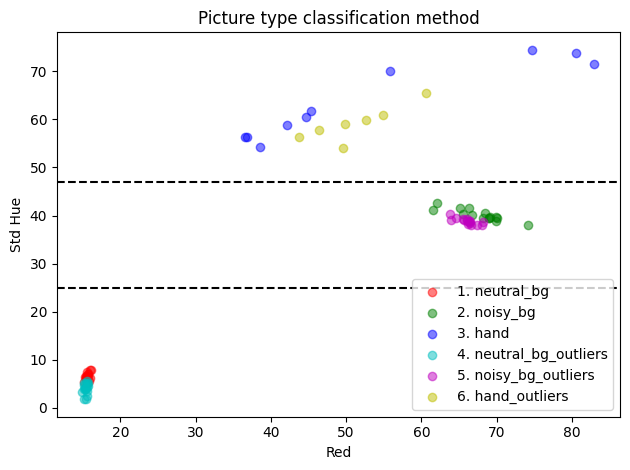

In [7]:
## plot of the h-mean and h-std of the images, labeled by their type, and the chosen thresholds

colors = ['r', 'g', 'b', 'c', 'm', 'y']

# Plotting
fig = plt.figure()
ax = fig.add_subplot(111)

for metric, color, label in zip(metrics, colors, labels):
    plt.scatter(metric[0], metric[1], marker = "o", c=color, label=label, alpha=0.5)
    
ax.set_xlabel('Red')
ax.set_ylabel('Std Hue')
ax.legend()

# Plot thresholds
ax.axhline(y=hand_threshold, color='k', linestyle='--')
ax.axhline(y=neutral_threshold, color='k', linestyle='--')

plt.title("Picture type classification method")
plt.tight_layout()
plt.show()

In [8]:
def find_type(image, bgr=True):
    """ image: the BGR/RGB image whose type is unknown
        returns: the type of the image
    """
    
    if bgr:
        hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        std_h = np.std(hsv[:,:,0].ravel())
    else:
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        std_h = np.std(hsv[:,:,0].ravel())
        
    if std_h > neutral_threshold:
        if std_h > hand_threshold:
            return "hand"
        else:
            return "noisy"
    else:
        return "neutral"

## Helper functions
1. In order to find the coins in the images, we used the Houg circle transform which detects the location and the radius of circles in an image. We adjusted its parameters so that it only detects circles in a radius range, which was defined by looking at the number of pixels taken by the smallest and largest coins in the reference images, and expanding it by a margin of error (to account for inclinations that reduce the coin size for instance). We also limited the number of circles detected by ensuring that no circle can be detected at a distance smaller than twice the minimum radius, which would mean that two coins overlap. 

2. Additionnaly, we created a function to adress the issue of multiple circles overlapping when comparing the result of two different Hough circle transforms. To do this, we simply merged the overlapping circles into one that represents the average circle.

In [9]:
# found by inspection of the reference images
r_min = int(0.9*380//2)
r_max = int(1.1*800//2)

# Hough circle transform with adjusted parameters
def detect_circles(image, t1, t2):
    
    # Apply GaussianBlur to reduce noise
    blurred = cv2.GaussianBlur(image, (5, 5), 2)
    
    # Apply Hough Circle Transform
    circles = cv2.HoughCircles(
        blurred,
        cv2.HOUGH_GRADIENT,
        dp=1,
        minDist=2*r_min,
        param1=t1,
        param2=t2,
        minRadius=r_min,
        maxRadius=r_max
    )
    
    circles_list = []
    
    if circles is not None:
        circles = np.round(circles[0, :])
        circles_list = [c for c in circles]
    
    return circles_list

In [10]:
def merge_circles(circles):
    """ Given a list of circles [[x,y,r],...], this function returns a new list of circles, with overlapping circles
    reduced to the mean of their information.
    """
    
    merged_circles = []
    skip_indices = []
    
    for i, circle in enumerate(circles):
        if i not in skip_indices:
            
            overlapping_circles = [circle]
            
            for j, compared_circle in enumerate(circles):
                if i != j and np.linalg.norm(circle[0:2]-compared_circle[0:2]) < 0.8*r_min:
                    skip_indices.append(j)
                    overlapping_circles.append(compared_circle)
                                 
            merged_circles.append(np.mean(overlapping_circles, axis=0))
    
    return merged_circles

### Method
In order to find the coins in a picture, we chose colorspaces that helped to separate the coins from their surroundings. The color space choice was motivated by the results of the color space analysis done previously on some samples. Then, we adjusted the two parameters of the Hough circle transform to reject false circles while keeping the coins. The first parameter is the edge detector threshold, which is stricter the higher the value, which means only clear edges are kept. The second parameter is a threshold on the quality of the circles, which can be understood as the sum of the edges pixels along the perimeter for a given radius. In order to reject noise, we can increase the second threshold until false circles disappear and coins remain. We also apply a gaussian filter on the image, but the larker its kernel, the lower the first thresholds should be, as the coins edges risk being to subtle to detect. However, a suficently high edge detection threshold is also desired in order to reject noise. Thus, an equilibrium has to be found  between the tresholds and the filter size. Because our coins are near perfect circles, it is a good idea to have a high second parameter and a low edge detection.

### Hand background
The hand case proved to be the most challenging. To reliably find all coins, we used 3 Hough transforms and merged the information of the detected circles. Indeed, some coins were not detected depending on the choice of color space, which meant that additionnal information had to be added. The color spaces that we used are the following: GRAYSCALE, A (LAB), B (LAB). The following case explains why such a strategy was required.

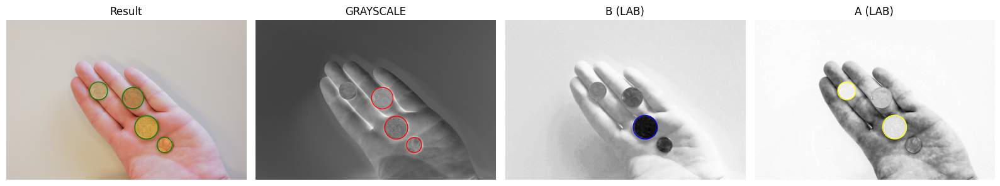

In [11]:
image_path = os.path.join("..", "data", "project", "train", "3. hand" , "L1010395.JPG")

image = cv2.imread(image_path)

## 1
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
c2 = detect_circles(gray, 80, 70)

plt.figure(figsize=(16, 8))
plt.subplot(142)
plt.imshow(gray, cmap="Greys")
plt.axis("off")
plt.title("GRAYSCALE")

# Plot circles on the image
for circle in c2:
    x, y, radius = circle
    circ = Circle((x, y), radius, color='red', fill=False)
    plt.gca().add_patch(circ)

## 2
blurred_b = cv2.GaussianBlur(cv2.cvtColor(image, cv2.COLOR_BGR2LAB)[:,:,2], (31, 31), sigmaX=0)
c1 = detect_circles(blurred_b, 6, 55)

plt.subplot(143)
plt.imshow(blurred_b, cmap="Greys")
plt.axis("off")
plt.title("B (LAB)")

# Plot circles on the image
for circle in c1:
    x, y, radius = circle
    circ = Circle((x, y), radius, color='blue', fill=False)
    plt.gca().add_patch(circ)

## 3
edgy = cv2.GaussianBlur(cv2.cvtColor(image, cv2.COLOR_BGR2LAB)[:,:,1], (19, 19), sigmaX=0)
ce = detect_circles(edgy, 15, 30)

plt.subplot(144)
plt.imshow(edgy, cmap="Greys")
plt.axis("off")
plt.title("A (LAB)")

# Plot circles on the image
for circle in ce:
    x, y, radius = circle
    circ = Circle((x, y), radius, color='yellow', fill=False)
    plt.gca().add_patch(circ)

plt.subplot(141)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Result")
plt.axis("off")

circles = merge_circles(c1+c2+ce)
for circle in circles:
    x, y, radius = circle
    circ = Circle((x, y), radius, color='green', fill=False)
    plt.gca().add_patch(circ)

plt.tight_layout()
plt.show()

In [12]:
def hand_localisation(image):
    """
    Returns the position of the circles in the "hand" case.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    blurred_b = cv2.GaussianBlur(lab[:,:,2], (31, 31), sigmaX=0)
    # edgy = cv2.GaussianBlur(lab[:,:,1], (11, 11), sigmaX=0)
    edgy = cv2.GaussianBlur(lab[:,:,1], (19, 19), sigmaX=0)

    ce = detect_circles(edgy, 15, 30)
    c2 = detect_circles(gray, 80, 70)
    c1 = detect_circles(blurred_b, 6, 55)
    
    return merge_circles(c1+c2+ce)

[]

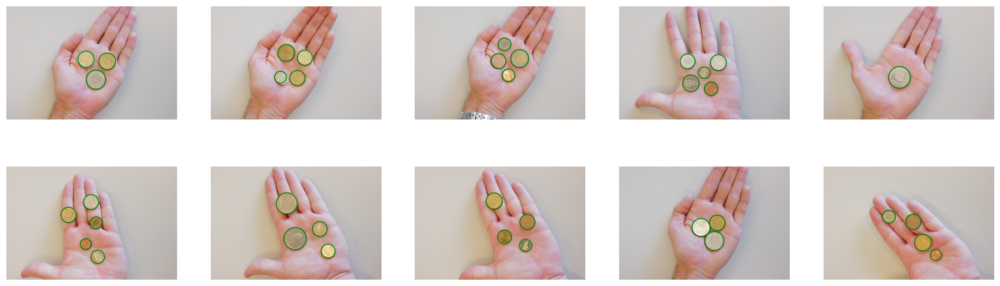

In [13]:
# We verify our strategy on the train dataset
dir_path = os.path.join("..", "data", "project", "train", "3. hand")

fig, ax = plt.subplots(2,5, figsize=(20, 6))
    
for i, file in enumerate(os.listdir(dir_path)):

    file_path = os.path.join(dir_path, file)
    image = cv2.imread(file_path)
    
    circles = hand_localisation(image)

    ax[i//5, i%5].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[i//5, i%5].axis("off")
    
    # Plot circles on the image
    for circle in circles:
        x, y, radius = circle
        circ = Circle((x, y), radius, color='green', fill=False)
        ax[i//5, i%5].add_patch(circ)
    
plt.plot()

### Noisy background

The goal here is to remove as much of the background as possible, while keeping the coins. First, we process the B (LAB) component on which coins can be extracted by thresholding, but where some unwanted noise remains. Second, we remove additionnal noise by processing the G (BGR) component of the image, which complementary noise to the B component which we can isolate by thresholding. Finally, the result is extracted using the logic Coins = (Coins + Noise)_B - (Noise)_G, and by using morphology operations to clean the image.

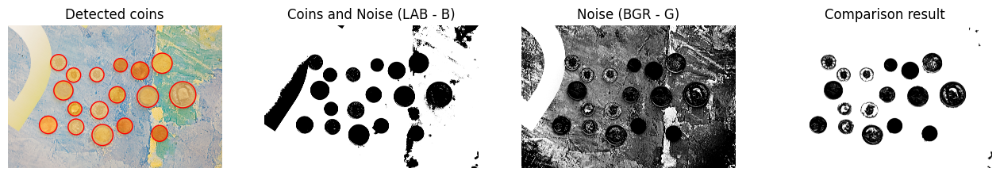

In [14]:
image_path =  os.path.join("..", "data", "project", "train", "2. noisy_bg" , "L1010370.JPG")

image = cv2.imread(image_path)
plt.figure(figsize=(16, 8))

lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

A = lab[:,:,2]
processing = np.zeros_like(A, dtype=np.uint8)
processing[A>150] = 100

B = image[:,:,1]
anti = np.zeros_like(B, dtype=np.uint8)
anti[B<195] = 100

plt.subplot(143)
plt.imshow(anti, cmap="Greys")
plt.title("Noise (BGR - G)")
plt.axis("off")

anti = 100*np.logical_and(anti, processing).astype(np.uint8)

disk_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))  # Adjust the size of the disk kernel as needed
anti = cv2.erode(anti, disk_kernel)
anti = remove_small_objects(anti.astype(bool), min_size=800)
anti = 100*cv2.dilate(anti.astype(np.uint8), disk_kernel)
anti = cv2.GaussianBlur(anti, (31,31), sigmaX=0)

plt.subplot(142)
plt.imshow(processing, cmap="Greys")
plt.title("Coins and Noise (LAB - B)")
plt.axis("off")

plt.subplot(144)
plt.imshow(anti, cmap="Greys")
plt.title("Comparison result")
plt.axis("off")

###
plt.subplot(141)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Detected coins")
plt.axis("off")

circles = detect_circles(anti, 70, 20)

# Plot circles on the image
for circle in circles:
    x, y, radius = circle
    circ = Circle((x, y), radius, color='red', fill=False)
    plt.gca().add_patch(circ)
    
plt.show()

In [15]:
def noisy_localisation(image):
    """
    Returns the position of the circles in the "noisy_bg" case.
    """
    
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    A = lab[:,:,2]
    B = image[:,:,1]
    processing = np.zeros_like(A, dtype=np.uint8)
    processing[A>150] = 100 

    anti = np.zeros_like(B, dtype=np.uint8)
    anti[B<195] = 100
    anti = 100*np.logical_and(anti, processing).astype(np.uint8)
    disk_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))  # Adjust the size of the disk kernel as needed
    anti = cv2.erode(anti, disk_kernel)
    anti = remove_small_objects(anti.astype(bool), min_size=800)
    anti = 100*cv2.dilate(anti.astype(np.uint8), disk_kernel)
    anti = cv2.GaussianBlur(anti, (31,31), sigmaX=0)
    
    return detect_circles(anti, 70, 20)

[]

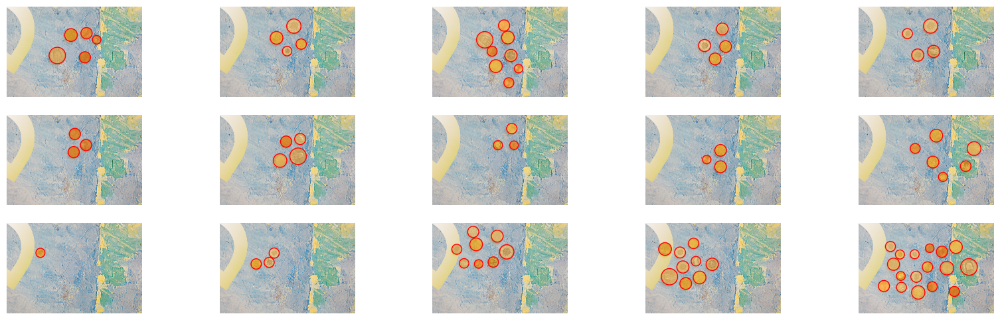

In [16]:
# We test our strategy on the train dataset

dir_path =  os.path.join("..", "data", "project", "train", "2. noisy_bg")

fig, ax = plt.subplots(3, 5, figsize=(20, 6))

for i, file in enumerate(os.listdir(dir_path)):

    file_path = os.path.join(dir_path, file)
    image = cv2.imread(file_path)

    ax[i//5, i%5].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap="Greys")
    ax[i//5, i%5].axis("off")
    
    circles = noisy_localisation(image)

    # Plot circles on the image
    for circle in circles:
        x, y, radius = circle
        circ = Circle((x, y), radius, color='red', fill=False)
        ax[i//5, i%5].add_patch(circ)
    
plt.plot()

### Neutral background
This case didn't required much processing as the background is regular and distinguishable from the coins. We simply applied the circle detection on the grayscale image after a gaussian blur. 

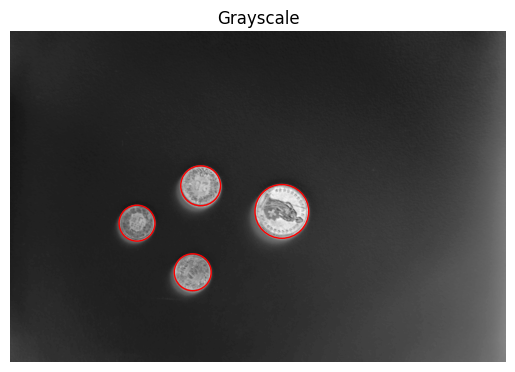

In [17]:
image_path =  os.path.join("..", "data", "project", "train", "1. neutral_bg", "L1010279.JPG")

image = cv2.imread(image_path)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred_gray = cv2.GaussianBlur(gray, (31,31), sigmaX=0)
circles = detect_circles(blurred_gray, 10, 55)

###
plt.imshow(blurred_gray, cmap="Greys")
plt.axis("off")
plt.title("Grayscale")

# Plot circles on the image
for circle in circles:
    x, y, radius = circle
    circ = Circle((x, y), radius, color='red', fill=False)
    plt.gca().add_patch(circ)

plt.show()

In [18]:
def neutral_localisation(image):
    """
    Returns the position of the circles in the "neutral_bg" case.
    """
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred_gray = cv2.GaussianBlur(gray, (31,31), sigmaX=0)
    
    return detect_circles(blurred_gray, 10, 55)

[]

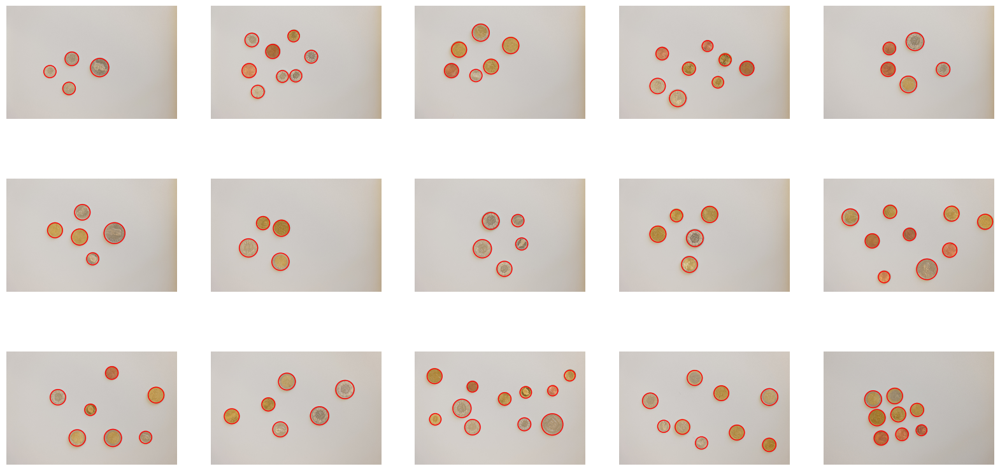

In [19]:
# We test our strategy on the train dataset

dir_path =  os.path.join("..", "data", "project", "train", "1. neutral_bg")

fig, ax = plt.subplots(3, 5, figsize=(20, 10))
    
for i, file in enumerate(os.listdir(dir_path)[1:]):

    file_path = os.path.join(dir_path, file)
    image = cv2.imread(file_path)

    ax[i//5, i%5].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap="Greys")
    ax[i//5, i%5].axis("off")
    
    circles = neutral_localisation(image) # solves outliers

    # Plot circles on the image
    for circle in circles:
        x, y, radius = circle
        circ = Circle((x, y), radius, color='red', fill=False)
        ax[i//5, i%5].add_patch(circ)
    
plt.plot()

In [20]:
def find_coins(image):
    """
    Returns the position of the circles by detecting the image type and choosing the corresponding
    coin localisation function.
    """
    
    imtype = find_type(image)
    
    match imtype:
        case "neutral":
            circles = neutral_localisation(image)
            
        case "noisy":
            circles = noisy_localisation(image)
            
        case "hand":
            circles = hand_localisation(image)
    
    return [circles, imtype]

def extract_coins(image, circles, resize=False):
    """
    Given the position of the coins (described by their circle) on the image, 
    returns the image portion containing the coin, padded with black pixels if
    the coin exceeds the image boundary. Optionnal scaling of the coin available.
    """
        
    coins = []
    
    for c in circles:
        
        pos = np.round(np.asarray(c)).astype(np.int16)  # Convert to integers using rounding

        # Ensure indices are within bounds
        y_start = max(0, pos[1] - pos[2])
        y_end = min(image.shape[0], pos[1] + pos[2] + 1)
        x_start = max(0, pos[0] - pos[2])
        x_end = min(image.shape[1], pos[0] + pos[2] + 1)

        # Slicing the image with clamped indices
        img = image[y_start:y_end, x_start:x_end, :]

        # Calculate padding for rows and columns based on the distance from the coin's center to the image border
        pad_top = max(0, pos[2] - pos[1])  # Distance from the center of the coin to the top border
        pad_bottom = max(0, pos[2] - (image.shape[0] - pos[1]))  # Distance from the center of the coin to the bottom border
        pad_left = max(0, pos[2] - pos[0])  # Distance from the center of the coin to the left border
        pad_right = max(0, pos[2] - (image.shape[1] - pos[0]))  # Distance from the center of the coin to the right border

        # Define the padding for each side (top, bottom, left, right)
        padding = ((pad_top, pad_bottom), (pad_left, pad_right), (0, 0))

        # Pad the image with black pixels (0)
        square_img = np.pad(img, padding, mode='constant', constant_values=0) 
               
        if resize: 
            square_img = cv2.resize(square_img, (800, 800))

        coins.append(square_img)
        
    return coins

### Performance evaluation
Finally, we evaluate the success of our strategy by comparing the number of coins detected versus the ground truth. The evaluation may return perfect match even though the position of the coins was off-mark in the event of an equal amount of coin misses and false positives.

In [ ]:
## To evaluate the localisation errors

train_folder = os.path.join("..", "data", "project", "train")

misses = []

for key, coins in data_dict.items():
    
    image_folders = os.listdir(train_folder)
    
    for folder in image_folders:
        
        image_path = os.path.join(train_folder, folder, key + ".JPG")
        
        if os.path.isfile(image_path):
            image = cv2.imread(image_path)
            circles = find_coins(image)[0]
            if len(circles) != np.sum(coins): misses.append(image_path)

## To see the localisation errors
if len(misses) == 0:
    print("The predicted number of coins was accurate")
else:
    ## block to check misses
    index = 0
    print(f"There were {len(misses)} misses among the predicted number of coins.")
    print("Misses:", misses)

    image = cv2.imread(misses[index])

    t = find_type(image, True)

    match t:
        case "neutral":
            circles = neutral_localisation(image)
        case "noisy":
            circles = noisy_localisation(image)
        case "hand":
            circles = hand_localisation(image)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(t + f": {len(circles)} coins detected")

    # Plot circles on the image
    for circle in circles:
        x, y, radius = circle
        circ = Circle((x, y), radius, color='red', fill=False)
        plt.gca().add_patch(circ)

    plt.tight_layout()
    plt.show()

## 2. 3. Feature extraction and classification

Now that we are able extract the picture of each coin in the image, we want to identify their type. The approach that we have taken is to train a neural network (NN) to combine the feature extraction and the classification of the coins. To this end, we need to label the coins in the training set, design a NN, and prepare the coin images and their labels for the integration in the NN. In the following function, we remove the background of the coins to ensure that the information contained in the image is as clear as possible.

In [23]:
mask = np.zeros((800, 800), dtype=np.uint8)
center = (400, 400)  # Center of the image
radius = 400  # Radius of the inscribed circle
cv2.circle(mask, center, radius, (255), -1)
mask_inv = cv2.bitwise_not(mask)
    
def remove_outer(image, grayscale=True):
    """
    For an 800*800 (Optionnal: *3) image, set all pixels outside of the inscribed circle to black.
    """
    img = np.copy(image)
    
    if grayscale: img[mask_inv == 255] = 0
    else: img[mask_inv == 255] = [0, 0, 0]
    
    return img

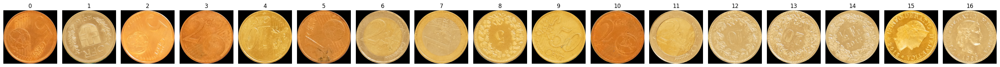

In [24]:
## Demonstration

image_path =  os.path.join("..", "data", "project", "train", "2. noisy_bg" , "L1010370.JPG")
image = cv2.imread(image_path)

coin_images = extract_coins(image, find_coins(image)[0], resize=True)
coin_images = [remove_outer(coin, grayscale=False) for coin in coin_images]

plt.figure(figsize=(30, 30))

for i, coin in enumerate(coin_images):
    plt.subplot(1, len(coin_images), i+1)
    img = cv2.cvtColor(coin, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title(str(i))
    plt.axis("off")

plt.tight_layout()
plt.show()

We start by extracting the image of all the coins contained in the training set.

In [25]:
#Labelling toggle
if True:
    
    train_folder = os.path.join("..", "data", "project", "train")

    coin_image_list = []
    coin_radius_list = []
    coin_type_list = []


    for folder in os.listdir(train_folder):
        folder_path = os.path.join(train_folder, folder)
        
        for image_file in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_file)
            image = cv2.imread(image_path)
            
            circles, imtype = find_coins(image)
            radii = np.asarray(circles)[:,2]
            
            coin_type_list.extend(len(circles)*[imtype])
            
            coin_images = extract_coins(image, circles, resize=True)
            coin_images = [remove_outer(coin, grayscale=False) for coin in coin_images]
            
            coin_image_list.extend(coin_images)
            coin_radius_list.extend(radii.tolist())
            
    print(f"{len(coin_image_list)} coins discovered in the training set")

    coin_image_list = np.asarray(coin_image_list)
    # np.save("coin_image_list_new", coin_image_list)

    coin_radius_list = np.asarray(coin_radius_list)
    # np.save("coin_radius_list_new", coin_radius_list)
    
    coin_type_list = np.asarray(coin_type_list)
    # np.save("coin_type_list_new", coin_type_list)
    
# The file was too heavy to upload
else:
    coin_image_list = np.load("coin_image_list.npy")
    coin_radius_list = np.load("coin_radius_list.npy")
    coin_type_list = np.load("coin_type_list.npy")
    print("Loaded: coin_image_list.npy, coin_radius_list.npy, coin_type_list.npy")

382 coins discovered in the training set


For the classification taks, we create a coin label definition and a function that returns a vector with the value at the index of the corresponding label set to 1 and others to 0.

In [26]:
coin_labels = ["2e", "1e", "05e", "02e", "01e", "005e", "002e", "001e", "5f", "2f", "1f", "05f", "02f", "01f", "005f", "o"]

def get_label_vector(label):
    """
    Vector with the value at the index of the corresponding label set to 1 and others to 0
    """
    vector = [0] * len(coin_labels)
    index = coin_labels.index(label)
    vector[index] = 1

    return vector

In order to label the images in the most convenient way, we created a small GUI that labels the coins by pressing on the corresponding button. Use the toggle to load the previously extracted labels. 

In [30]:

## choose to load labels or manually label each image
if True:
    counter = 0
    coin_label_list = []

    def button_click(label):
        global coin_label_list
        if counter < len(coin_image_list):
            coin_label_list.append(get_label_vector(label))
        display_image()

    def display_image():
        global counter
        # Check if there are images left
        if counter < len(coin_image_list):
            # Convert BGR to RGB
            opencv_image = coin_image_list[counter]
            rgb_image = cv2.cvtColor(opencv_image, cv2.COLOR_BGR2RGB)
            
            # Convert to PIL Image
            pil_image = Image.fromarray(rgb_image)
            
            # Resize the image if needed
            pil_image = pil_image.resize((300, 300))
            
            # Convert PIL Image to Tkinter PhotoImage
            img_tk = ImageTk.PhotoImage(pil_image)

            # Update the label's image
            label_img.configure(image=img_tk)
            label_img.image = img_tk  # Keep a reference to avoid garbage collection
            
            # Update the text zone
            info_label.place(relx=0.5, rely=0.1, anchor=tk.CENTER)
            info_label.config(text=f"Radius: {int(coin_radius_list[counter])}, {counter}/{len(coin_image_list)}")
            
            # Increment counter for the next image
            counter += 1
        else:
            print("No more images to display.")
            
    root = tk.Tk()
    root.title("Coin Label GUI")

    # Create a frame to contain the buttons
    button_frame = tk.Frame(root)
    button_frame.pack(side=tk.LEFT, padx=10)

    # Create buttons for each label with larger size and spacing
    for label in coin_labels:
        button = tk.Button(button_frame, text=label, command=lambda l=label: button_click(l), width=10, height=2)
        button.pack(pady=5)

    # Create a label to display the image
    label_img = tk.Label(root)
    label_img.pack(side=tk.LEFT, padx=10)

    # Create a label for displaying information about the image
    info_label = tk.Label(root, text="", font=("Helvetica", 12))
    # info_label.pack(side=tk.LEFT, padx=10)
    info_label.pack()

    # Display the first image at startup
    display_image()

    root.mainloop()

    coin_label_list = np.asarray(coin_label_list)
    np.save("coin_label_list_new", coin_label_list)
    
else:
    coin_label_list = np.load("coin_label_list.npy")
    print(f"Loaded: coin_label_list.npy - {len(coin_label_list)} labels contained")


Loaded: coin_label_list.npy - 382 labels contained


Because the back side of some CHF coins is undistinguishable from another without using the information of the size of the coin, we created merged label list that represents the classes that we want the NN to detect. We will then manually choose which is the corresponding label for the merged labels using the detected radius. 

In [31]:
reduced_labels = np.empty((len(coin_label_list), 13), dtype=np.uint8)
reduced_labels[:,0:9] = coin_label_list[:,0:9] # No difference in the EURs
reduced_labels[:,9] = np.sum(coin_label_list[:,9:12], axis=1) # Labels 9 to 11 are merged
reduced_labels[:,10] = np.sum(coin_label_list[:,12:14], axis=1) # Labels 12 and 13 are merged
reduced_labels[:,11:13] = coin_label_list[:,14:16] # No difference the last two labels

# This corresponds to the following labels
coin_labels_reduced = ["2e", "1e", "05e", "02e", "01e", "005e", "002e", "001e", "5f", "2-1-0.5f", "02-01f", "005f", "o"]

# comparison
print("label set", coin_labels)
print(coin_label_list[0])
print("reduced label set:", coin_labels_reduced)
print(reduced_labels[0])

label set ['2e', '1e', '05e', '02e', '01e', '005e', '002e', '001e', '5f', '2f', '1f', '05f', '02f', '01f', '005f', 'o']
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
reduced label set: ['2e', '1e', '05e', '02e', '01e', '005e', '002e', '001e', '5f', '2-1-0.5f', '02-01f', '005f', 'o']
[1 0 0 0 0 0 0 0 0 0 0 0 0]


To make the model more robust, we extend our training set by using random affine transformations (translation and rotation) and random Gaussian blurs on the images of the training set.

In [32]:
def generalise_image(image):
    """
    Applies a random affine transformation (translation and rotation) 
    and a random Gaussian blur to the image.
    """
    (h, w) = image.shape[:2]
    
    # Rotation
    center = (w // 2, h // 2)
    angle = random.uniform(0, 360)
    M_rotation = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, M_rotation, (w, h))
    
    # Blur
    blur = random.uniform(0, 5)
    blurred_image = cv2.GaussianBlur(rotated_image, ksize=(11,11), sigmaX=blur, sigmaY=blur)
    
    # Translation
    max_translation = 50  # Maximum translation in pixels
    tx = random.uniform(-max_translation, max_translation)
    ty = random.uniform(-max_translation, max_translation)
    M_translation = np.float32([[1, 0, tx], [0, 1, ty]])
    translated_image = cv2.warpAffine(blurred_image, M_translation, (w, h))
    
    return translated_image       

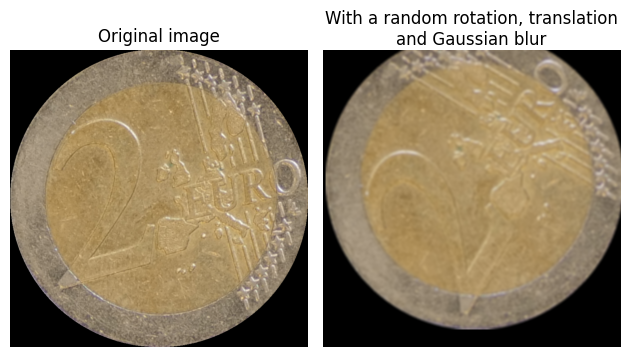

In [33]:
# demonstration

imtest = coin_image_list[0]        
duplicate = generalise_image(imtest)

plt.subplot(121)
plt.title("Original image")
plt.imshow(cv2.cvtColor(imtest,cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(122)
plt.title("With a random rotation, translation and Gaussian blur", wrap=True)
plt.imshow(cv2.cvtColor(duplicate,cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()

We can now create our training dataset, containing our train coin pictures on which the previously described transformation is automatically applied.

In [34]:
class CustomImageDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels.astype(np.float32)
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        
        image = generalise_image(image)
        image = Image.fromarray(image.astype('uint8'), 'RGB')
  
        if self.transform:
            image = self.transform(image)
        
        return image, label

The NN model we used is [ResNet18](https://pytorch.org/vision/main/models/generated/torchvision.models.resnet18.html), pretrained on IMAGENET1K_V1. The choice of this model was motivated by its small weight and fast computation time (compared to other NN such as ResNet50). We used pretrained weights to increase the degree of generalisation. We also tried other NN, such as SqueezeNet and ShuffleNet which are even more lightweight, but their performance wasn't as good. To validate the performances, we separated our dataset in a training and validation dataset, in a ratio of 90/10, and plotted the evolution of the loss and f1 score for both sets. The model with best f1 score on the validation dataset was kept. 

![](training.png "Title") 

In [35]:
model_load_path = 'resnet18_model.pth'
model_save_path = 'resnet18_model_new.pth'

# Model train toggle
if True:
    
    # Test the model on a single image from the dataset
    def test_model_on_image(model, dataset, idx):
        # Get the image and label from the dataset
        image, true_label = dataset[idx]
        
        # Add batch dimension and move the image to the appropriate device
        image = image.unsqueeze(0)  # Add batch dimension
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        image = image.to(device)
        model = model.to(device)

        # Perform inference
        with torch.no_grad():
            outputs = model(image)
            _, predicted_label = torch.max(outputs, 1)
            
        true_label = np.argmax(true_label)

        return predicted_label.item(), true_label
        
    def compute_f1_score(model, dataset):

        true_labels = []
        predicted_labels = []
        
        with torch.no_grad():
            for i in range(len(dataset)):
                predicted_label, true_label = test_model_on_image(model, dataset, i)
                true_labels.append(true_label)
                predicted_labels.append(predicted_label)
        
        # Compute the F1 score
        f1 = f1_score(true_labels, predicted_labels, average='macro')  # or 'micro' or 'weighted' depending on your needs
        return f1

    num_classes = 13  # Adjust according to your dataset
    batch_size = 16
    num_epochs = 40
    learning_rate = 0.001
    val_split = 0.1 # Such that there are 90 train images for 10 validation images (90/10)

    # Data loading and splitting
    dataset = CustomImageDataset(coin_image_list, reduced_labels, transform=ResNet18_Weights.IMAGENET1K_V1.transforms())
    dataset_size = len(dataset)
    val_size = int(val_split * dataset_size)
    train_size = dataset_size - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    # Model initialization
    if True: # New train
        model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, num_classes)
    else: # Load previous model
        model = resnet18(weights=None)
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, num_classes)
        model.load_state_dict(torch.load(model_load_path))  # Load the saved state dictionary        

    # Criterion and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = Adam(model.parameters(), lr=learning_rate)

    # Training and evaluation
    best_f1 = 0.0
    best_epoch = 0
    train_losses = []
    val_losses = []
    train_f1_scores = []
    val_f1_scores = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for images, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * images.size(0)

        epoch_loss = running_loss / len(train_dataset)
        train_losses.append(epoch_loss)

        ## validation evaluation
        model.eval()
        
        train_f1 = compute_f1_score(model, train_dataset)
        train_f1_scores.append(train_f1)
        
        val_f1 = compute_f1_score(model, val_dataset)
        val_f1_scores.append(val_f1)

        running_loss = 0.0
        with torch.no_grad():
            for images, labels in val_loader:
                outputs = model(images)
                loss = criterion(outputs, labels)
                
                running_loss += loss.item() * images.size(0)

        val_epoch_loss = running_loss / len(val_dataset)
        val_losses.append(val_epoch_loss)
        
        print(f"Epoch [{epoch + 1}/{num_epochs}], "
              f"Train Loss: {epoch_loss:.4f}, Train F1: {train_f1:.4f}, "
              f"Val Loss: {val_epoch_loss:.4f}, Val F1: {val_f1:.4f}")
        
        # Save the best model based on validation F1 score
        if val_f1 > best_f1:
            best_f1 = val_f1
            best_epoch = epoch + 1
            torch.save(model.state_dict(), model_save_path)

        
    # Plotting the losses and F1 scores
    epochs = range(1, num_epochs + 1)
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training Loss')
    plt.plot(epochs, val_losses, label='Validation Loss')
    plt.axvline(best_epoch, color='r', linestyle='--', label=f'Best Val F1 at Epoch {best_epoch}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_f1_scores, label='Training F1 Score')
    plt.plot(epochs, val_f1_scores, label='Validation F1 Score')
    plt.axvline(best_epoch, color='r', linestyle='--', label=f'Best Val F1 at Epoch {best_epoch}')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.legend()

    plt.tight_layout()
    
    plt.savefig('training.png')  # Save as PNG file

    plt.show()
        
else: ## Load model 
    model = resnet18(weights=None)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 13)
    model.load_state_dict(torch.load(model_load_path))  # Load the saved state dictionary
    model.eval()  # Set the model to evaluation mode

In [36]:
def test_model_on_coin(model, image):
    """
    Test a PyTorch model on a single coin image.

    Args:
    - model: A PyTorch model to be tested.
    - image: An input coin image.

    Returns:
    - The predicted label for the coin image.
    """
    
    model.eval()  # Set the model to evaluation mode
    
    image = Image.fromarray(image.astype('uint8'), 'RGB')
    image = ResNet18_Weights.IMAGENET1K_V1.transforms()(image)

    # Add batch dimension and move the image to the appropriate device
    image = image.unsqueeze(0)  # Add batch dimension
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    image = image.to(device)
    model = model.to(device)


    # Perform inference
    with torch.no_grad():
        outputs = model(image)
        _, predicted_label = torch.max(outputs, 1)
        
    return predicted_label.item()

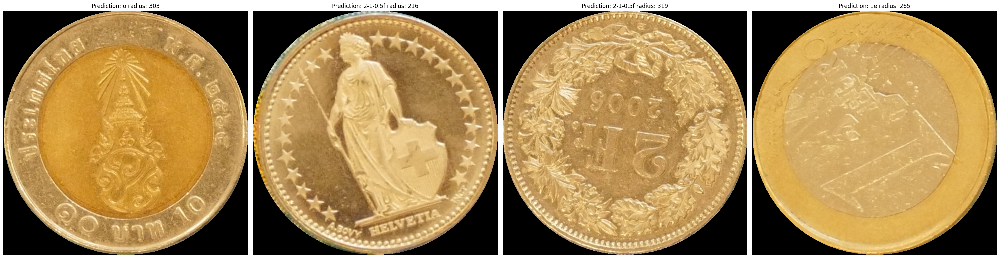

In [37]:
# demonstration

image_path =  os.path.join("..", "data", "project", "test", "L0000008.JPG")

image = cv2.imread(image_path)

circles, imtype = find_coins(image)

radii = np.asarray(circles)[:,2]

coin_images = extract_coins(image, circles, resize=True)
coin_images = [remove_outer(coin, grayscale=False) for coin in coin_images]

plt.figure(figsize=(30, 30))

for i, coin in enumerate(coin_images):
    
    coin_pred = coin_labels_reduced[test_model_on_coin(model, coin)]
    
    plt.subplot(1, len(coin_images), i+1)
    img = cv2.cvtColor(coin, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title("Prediction: " + coin_pred + f" radius: {int(radii[i])}")
    plt.axis("off")

plt.tight_layout()
plt.show()


We now want to identify the correct labels for the merged classes "2-1-0.5f" and "02-01f". We do this using thresholds on the radius of the coin, which we estimated by looking at the reference pictures.

In [38]:
def radius_sep3(radius):
    """
    Returns the label in [2f, 1f, 0.5f] depending on the radius
    """
    
    if radius > 295:
        return "2f"
    if radius > 240:
        return "1f"
    else:
        return "05f"

def radius_sep2(radius):
    """
    Returns the label in [02f, 01f] depending on the radius
    """
    
    if radius > 230:
        return "02f"
    else:
        return "01f"

## Prediction on the test set and Kaggle formatting

Using the prediction on a coin's label, we can now estimate the labels for each of the coins in a given image. We also want to format our predictions in a way that is understood by Kaggle.

In [39]:
# the labelling order of the kaggle which corresponds to our labelling format.
kaggle_labels = ["5f", "2f", "1f", "05f", "02f", "01f", "005f", "2e", "1e", "05e", "02e", "01e", "005e", "002e", "001e", "o"]

def kaggle_coin_vector(coin_image, coin_radius):
    """
    Based on the image of the coin, 
    finds the vector representing the coin in the format used for the Kaggle submission
    """
    
    # find the label in the reduced label set
    index = test_model_on_coin(model, coin_image)
    label = coin_labels_reduced[index]
    
    # distinguish the label for the merged coins
    match label:
        case "2-1-0.5f":
            label = radius_sep3(coin_radius)
        case "02-01f":
            label = radius_sep2(coin_radius)
    
    # Kaggle formatting
    vec = np.zeros_like(kaggle_labels, dtype=np.uint8)
    # Finds the corresponding index in Kaggle's formatting
    vec_label_index = kaggle_labels.index(label)
    vec[vec_label_index] = 1
    
    return vec
    
def kaggle_image_vector(image):
    """
    Based on a provided image, 
    finds the coins in the image,
    predicts their label and counts the total number of each coin type.
    """
    
    ## extract the coin images, radius, (and image type)
    circles, imtype = find_coins(image)
    radii = np.asarray(circles)[:,2]

    coin_images = extract_coins(image, circles, resize=True)
    coin_images = [remove_outer(coin, grayscale=False) for coin in coin_images]
    
    ## evaluate the coin's label and add it to the total number of each coin type in the image
    image_result = np.zeros_like(kaggle_labels, dtype=np.uint8)
    
    for coin, radius in zip(coin_images, radii):
        coin_vector = kaggle_coin_vector(coin, radius)
        image_result += coin_vector
        
    return image_result

def kaggle_result():
    """
    Predicts the total number of each coin type for each image in the test folder,
    and saves it to a csv file for Kaggle submission.
    """
    
    test_path = os.path.join("..", "data", "project", "test")
    output_csv_path = os.path.join("..", "labs", "result.csv")
    
    # Define the CSV header
    header = ["id", "5CHF", "2CHF", "1CHF", "0.5CHF", "0.2CHF", "0.1CHF", "0.05CHF",
              "2EUR", "1EUR", "0.5EUR", "0.2EUR", "0.1EUR", "0.05EUR", "0.02EUR", "0.01EUR", "OOD"]
    
    # Open the CSV file for writing
    with open(output_csv_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        # Write the header
        writer.writerow(header)
        
        images_path = os.listdir(test_path)
        
        start_time = time.time()  # Start time
        
        # Iterate over each image in the directory
        for i, image_file in enumerate(images_path):
            image_path = os.path.join(test_path, image_file)
            image = cv2.imread(image_path)
            
            # Get the image vector
            image_vector = kaggle_image_vector(image).tolist()
            
            # Extract the image id from the file name (remove file extension)
            image_id = image_file[:-4]
            
            # Create the row to be written to the CSV
            row = [image_id] + image_vector
            
            # Write the row to the CSV
            writer.writerow(row)
            
            # Estimate remaining time and print every 10 images
            if i % 10 == 0 and i != 0:
                elapsed_time = time.time() - start_time
                remaining = (len(images_path) - i - 1) * elapsed_time / (i + 1)
                
                remaining_min, remaining_sec = divmod(remaining, 60)
                print(f"{i} images evaluated, remaining time: approx {int(remaining_min)}:{int(remaining_sec)}")

Finally, we compute the results.

In [ ]:
kaggle_result()

## Additionnal remarks

While evaluating the testing set, we encountered an error where the image couldn't be corresctly resized. This happended in image L0000045 because a coin was partially out of the picture, and the whole coin image couldn't be extracted. To counter this issue, we modified the coin extraction function to add black pixels in the cropped direction, as illustrated below.

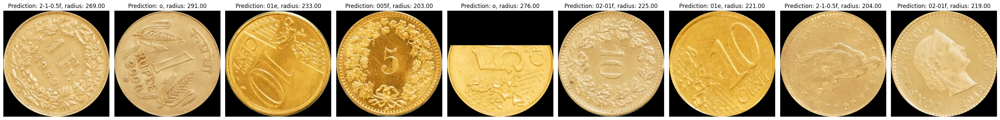

In [41]:
image_path =  os.path.join("..", "data", "project", "test", "L0000045.JPG")

image = cv2.imread(image_path)

circles, imtype = find_coins(image)

radii = np.asarray(circles)[:,2]

coin_images = extract_coins(image, circles, resize=True)
coin_images = [remove_outer(coin, grayscale=False) for coin in coin_images]

plt.figure(figsize=(30, 30))

for i, coin in enumerate(coin_images):
    
    coin_pred = coin_labels_reduced[test_model_on_coin(model, coin)]
    
    plt.subplot(1, len(coin_images), i+1)
    img = cv2.cvtColor(coin, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title("Prediction: " + coin_pred + f", radius: {radii[i]:.2f}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Possible improvements

1. We know that the radius of the coin is increased in the "hand" scenerios due to the perspective. This creates errors when we differentiate between the merged classes. We could counter this issue by artificially reducing the radius knowing the deformation factor, to increase the quality of our decision.